In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import json

In [2]:
ROUTES_FILE_CLEANED = "../data/cleaned/cleaned_earth_routes.csv"

EU_COUNTRIES_FILE_CLEANED_CSV = "../data/cleaned/eu_cleaned_countries.csv"

EU_ROUTES_FILE_CLEANED = "../data/cleaned/eu_cleaned_routes.csv"
EU_AIRLINES_ROUTES_FILE_CLEANED = "../data/cleaned/eu_cleaned_airlines_routes.csv"

# Read Data

In [3]:
all_routes_complete_df = pd.read_csv(ROUTES_FILE_CLEANED, 
                           index_col = 0, 
                           header=0)

# all_routes_complete_df.head()

In [4]:
eu_countries_df = pd.read_csv(EU_COUNTRIES_FILE_CLEANED_CSV, 
                              index_col = 0, 
                              header=0)
# eu_countries_df.head()

# Route Data Cleaning

In [5]:
eu_countries_list = eu_countries_df['country'].values

In [6]:
eu_routes_complete_df = all_routes_complete_df[all_routes_complete_df['Country_Source'].isin(eu_countries_list) & all_routes_complete_df['Country_Destination'].isin(eu_countries_list)]

In [7]:
eu_routes_complete_df.reset_index(drop=True, inplace=True)
eu_routes_complete_df.head()

,Airline_Code,Airport_Code_Source,Airport_Code_Destination,Airline_Name,Airline_Country,Name_Source,City_Source,Country_Source,Latitude_Source,Longitude_Source,Altitude_Source,Name_Destination,City_Destination,Country_Destination,Latitude_Destination,Longitude_Destination,Altitude_Destination,Distance_Km
0,QS,LPA,PRG,Travel Service,Czech Republic,Gran Canaria Airport,Gran Canaria,Spain,27.931900,-15.3866,78,Václav Havel Airport Prague,Prague,Czech Republic,50.1008,14.26,1247,3511.793564
1,QS,TFS,PRG,Travel Service,Czech Republic,Tenerife South Airport,Tenerife,Spain,28.044500,-16.5725,209,Václav Havel Airport Prague,Prague,Czech Republic,50.1008,14.26,1247,3573.157656
2,DY,ARN,PRG,Norwegian Air Shuttle,Norway,Stockholm-Arlanda Airport,Stockholm,Sweden,59.651901,17.9186,137,Václav Havel Airport Prague,Prague,Czech Republic,50.1008,14.26,1247,1087.101638
3,OK,ARN,PRG,Czech Airlines,Czech Republic,Stockholm-Arlanda Airport,Stockholm,Sweden,59.651901,17.9186,137,Václav Havel Airport Prague,Prague,Czech Republic,50.1008,14.26,1247,1087.101638
4,QS,ARN,PRG,Travel Service,Czech Republic,Stockholm-Arlanda Airport,Stockholm,Sweden,59.651901,17.9186,137,Václav Havel Airport Prague,Prague,Czech Republic,50.1008,14.26,1247,1087.101638


# Routes Vizulization

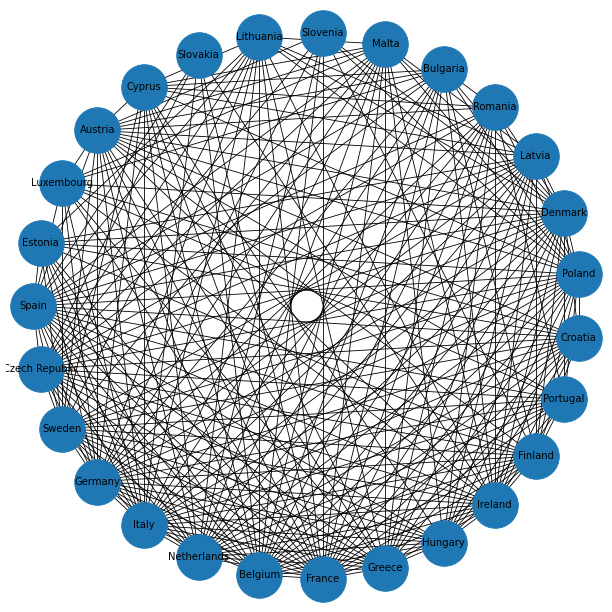

In [8]:
eu_country_route_graph = nx.from_pandas_edgelist(eu_routes_complete_df, 
                                                  'Country_Source', 
                                                  'Country_Destination', 
                                                  'Distance_Km')
fig = plt.figure(1, figsize=(10, 10), dpi=60)
nx.draw_shell(eu_country_route_graph, node_size=3000, with_labels=True)

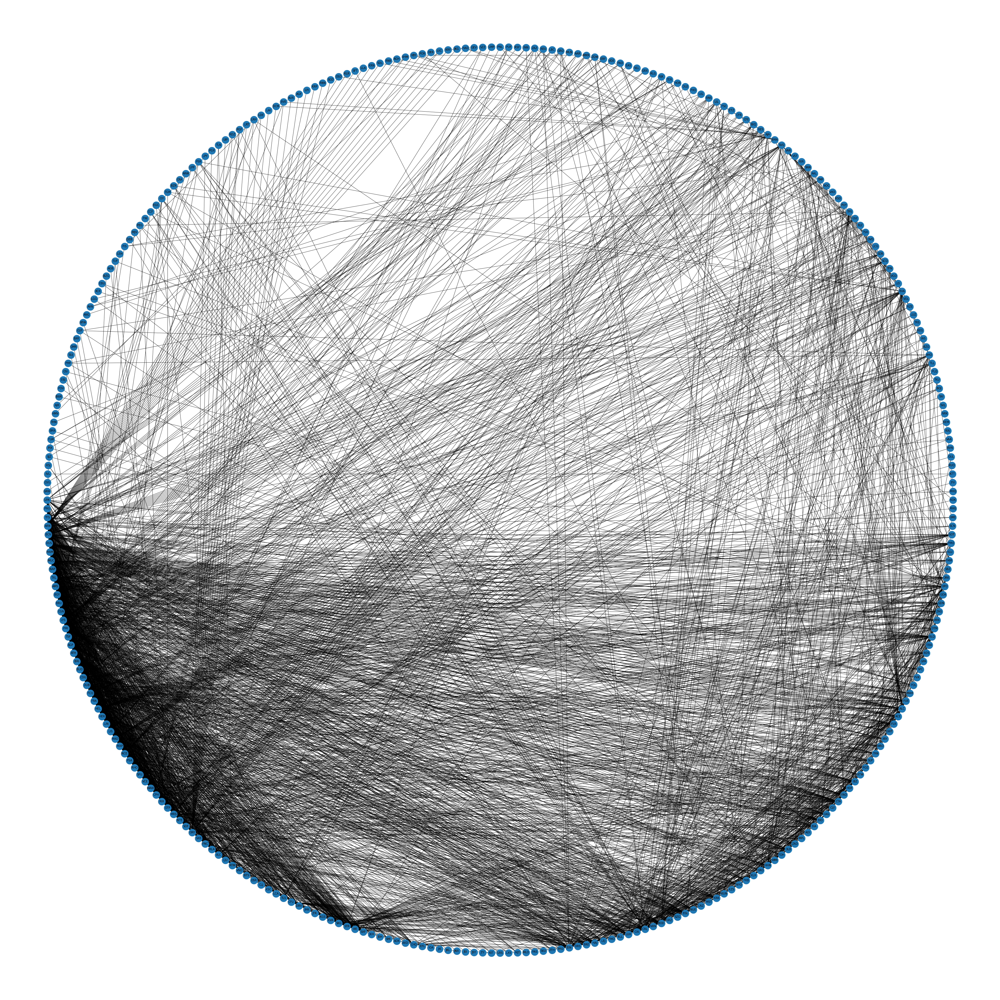

In [9]:
eu_routes_graph = nx.from_pandas_edgelist(eu_routes_complete_df, 
                                       'Airport_Code_Source', 
                                       'Airport_Code_Destination',
                                       'Distance_Km')
fig = plt.figure(1, figsize=(60, 60), dpi=60)
nx.draw_shell(eu_routes_graph, node_size=1000, with_labels=True)

# Save Route Data

In [10]:
eu_routes_complete_df.to_csv(EU_ROUTES_FILE_CLEANED)

In [11]:
airplanes_routes_df = nx.to_pandas_edgelist(eu_routes_graph)

In [12]:
airplanes_routes_df.to_csv(EU_AIRLINES_ROUTES_FILE_CLEANED)